<h1><b>I. LAND COVER CLASSIFICATION<b></h1>



#**1. Introduction**

<p style='text-align: justify;'> Land cover mapping (LCM) is one of the most commonly performed tasks in agro-environmental and geospatial research, whose domain ranges from physical geographic observations (e.g. information on the crop type, crop area, configuration of buildings, roads, identifying surface water bodies, etc.) to environmental planning Classification and mapping land cover using geospatial datasets has become the foundation in illustrating the Earth's complex biophysical systems such as storm-water runoff and watershed hydrology. On the other hand, land cover classification has become a powerful tool in explaining relationships between environmental changes to socio-economic activities. The recent advances in high-end computer programming and the availability of free satellite imageries have brought the data science and remote sensing in the same platform. It is now possible to quickly perform land cover and land use classifications over wider spatiotemporal spectrum using simplified machine learning or deep learning algorithms on powerful cloud computing platforms. However, there are several practical challenges in supervised land cover classification in the field of ecological modeling such as hyperparameter optimization and performance evaluation.</p>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **2. The Dataset**

The publicly available [Sundarbans Satellite Imagery](https://github.com/syamkakarla98/Satellite_Imagery_Analysis/tree/main/Data/sundarbans_data) from Shyamnagar upazila of Satkhira district in Bangladesh with coordinates of (89.0799E, 22.1341N & 89.1335E, 22.2930N) which is a part of the Sundarbans satellite data was used in this study [5].

In [2]:
!pip install ipyleaflet
!pip install rasterio
!pip install earthpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 50.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.7/56.7 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 62.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 20.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 23.5 MB/s eta 0:00:00


In [ ]:
!pip uninstall xgboost
!pip install xgboost==0.90

In [ ]:
print("Interactive Map for Study Location (the area with red rectange shape)")
from ipyleaflet import Map, Polygon
polygon = Polygon(
    locations=[(22.2929661069689722, 89.0798950195312642), (22.2929661069689722, 89.1334533691406250),
               (22.1341332998903049, 89.1334533691406250),(22.1341332998903049,89.0798950195312642)],
    color="red",
    fill_color="red",
    weight=1
)
myMap=Map(center=[22.2929661069689722, 89.0798950195312642], zoom=10)
myMap.add_layer(polygon)

myMap

Interactive Map for Study Location (the area with red rectange shape)


Map(center=[22.292966106968972, 89.07989501953126], controls=(ZoomControl(options=['position', 'zoom_in_text',…

<p style='text-align: justify;'> The dataset was acquired using the Sentinel-2 Satellite on 27 January 2020 which consists a total of 12 bands with the spectral resolution varying from 10-60 meters. After stacking these imageries into an n-dimensional array the resultant data has the shape of (12, 954, 298). The dataset also contains a ‘ground truth’ data with the shape of (954, 298) which has 6 classes namely water, plants, trees, bare land and geological contents.</p>

# **3. Supervised Algorithm for Classification of Study Location**

### **3.1) Setting the Environment**

In [3]:
from glob import glob
import numpy as np
import pandas as pd
from scipy.io import loadmat
import rasterio as rio
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import earthpy.plot as ep
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report
from pprint import pprint
from time import time
import os
import warnings
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

warnings.filterwarnings("ignore")
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams.update({'figure.figsize': (15, 10)})
plt.style.use('dark_background')

In [4]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split

from sklearn.ensemble import GradientBoostingClassifier

from sklearn.metrics import confusion_matrix
from sklearn.inspection import permutation_importance
from sklearn import metrics
from sklearn.metrics import f1_score

### **3.2) Read Data**
<p style='text-align: justify;'> At first, the Sentinel-2 satellite imagery including the ‘ground truth’ data of the project location was downloaded from the online source (Kakarla 2021), and then uploaded to the Jupyter Notebook. (using the ) to perform the projected tasks. Then, with the help of <b>‘Glob’</b> module and GDAL and Numpy-based Python library called <b>‘Rasterio’</b>, all 12 different spectral bands were composited or stacked to form a n-dimensional numpy array. The resultant data, which would later feed as the input data had the shape of 12 × 954 × 298.</p>

### **3.2.A) Training Data**

In [5]:
# Data Directory
os.chdir('/content/drive/MyDrive/Land_cover_clf/sundarbans_data')

# Read bands
sentinel_bands = glob('*B?*.tiff')
sentinel_bands.sort()

# Composite the bands
l = []
for i in sentinel_bands:
  with rio.open(i, 'r') as f:
    g=f.read(1)
    l.append(g)
    print(i,"has shape",g.shape)

# Data as array
arr_st = np.stack(l)

2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B01_(Raw).tiff has shape (954, 298)
2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B02_(Raw).tiff has shape (954, 298)
2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B03_(Raw).tiff has shape (954, 298)
2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B04_(Raw).tiff has shape (954, 298)
2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B05_(Raw).tiff has shape (954, 298)
2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B06_(Raw).tiff has shape (954, 298)
2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B07_(Raw).tiff has shape (954, 298)
2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B09_(Raw).tiff has shape (954, 298)


2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B11_(Raw).tiff has shape (954, 298)
2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B12_(Raw).tiff has shape (954, 298)
2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B8A_(Raw).tiff has shape (954, 298)


In [6]:
arr_st.shape

(11, 954, 298)

In [7]:
sentinel_bands

['2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B01_(Raw).tiff',
 '2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B02_(Raw).tiff',
 '2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B03_(Raw).tiff',
 '2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B04_(Raw).tiff',
 '2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B05_(Raw).tiff',
 '2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B06_(Raw).tiff',
 '2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B07_(Raw).tiff',
 '2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B09_(Raw).tiff',
 '2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B11_(Raw).tiff',
 '2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B12_(Raw).tiff',
 '2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B8A_(Raw).tiff']

### **3.2.B) Ground Truth**
<p style='text-align: justify;'> The ground truth of the satellite image is read using the loadmat method from the scipy.io package. The ground truth has 6 classes which include water, plants, trees, bare land, e.t.c which was two-dimensional (954 × 298).</p>

In [8]:
# Ground Truth
y_data = loadmat('/content/drive/MyDrive/Land_cover_clf/sundarbans_data/Sundarbands_gt.mat')['gt']
display(y_data)

array([[0, 0, 0, ..., 2, 2, 2],
       [0, 0, 0, ..., 2, 2, 2],
       [0, 0, 0, ..., 2, 2, 2],
       ...,
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2]], dtype=int32)

### **3.3) Data Visualization**
<p style='text-align: justify;'>These Sundarbans data have multiple numbers of bands that contain the data ranging from visible to infrared. So it is hard to visualize the data for humans. By creating an RGB Composite Image makes it easier to understand the data effectively. To plot RGB composite images, we have plot the red, green, and blue bands, which are bands 4, 3, and 2, respectively. Since Python uses a zero-based index system, so we need to subtract a value of 1 from each index. Therefore, the index for the red band is 3, green is 2, and blue is 1.
Let’s see the code to plot the RGB composite image along with the stretch applied.</p>

In [9]:
# %pip install earthpy
import earthpy.plot as ep
import matplotlib.pyplot as plt

### **3.3.1) 12 bands visualization**

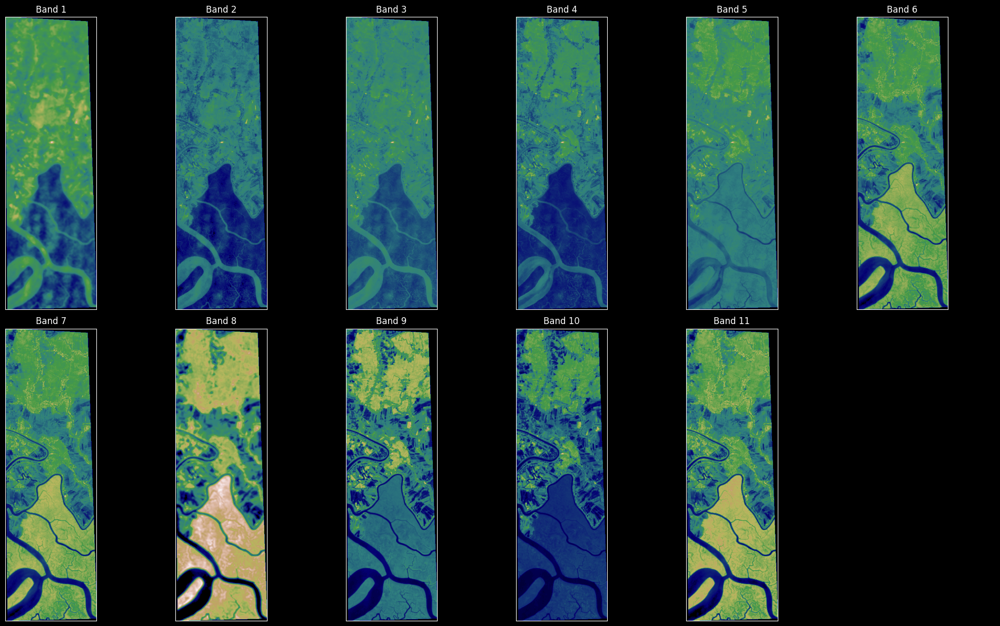

In [ ]:
ep.plot_bands(arr_st,
              cmap = 'gist_earth',
              figsize = (20, 12),
              cols = 6,
              cbar = False)
plt.show()

### **3.3.2) Data Distribution of all bands**

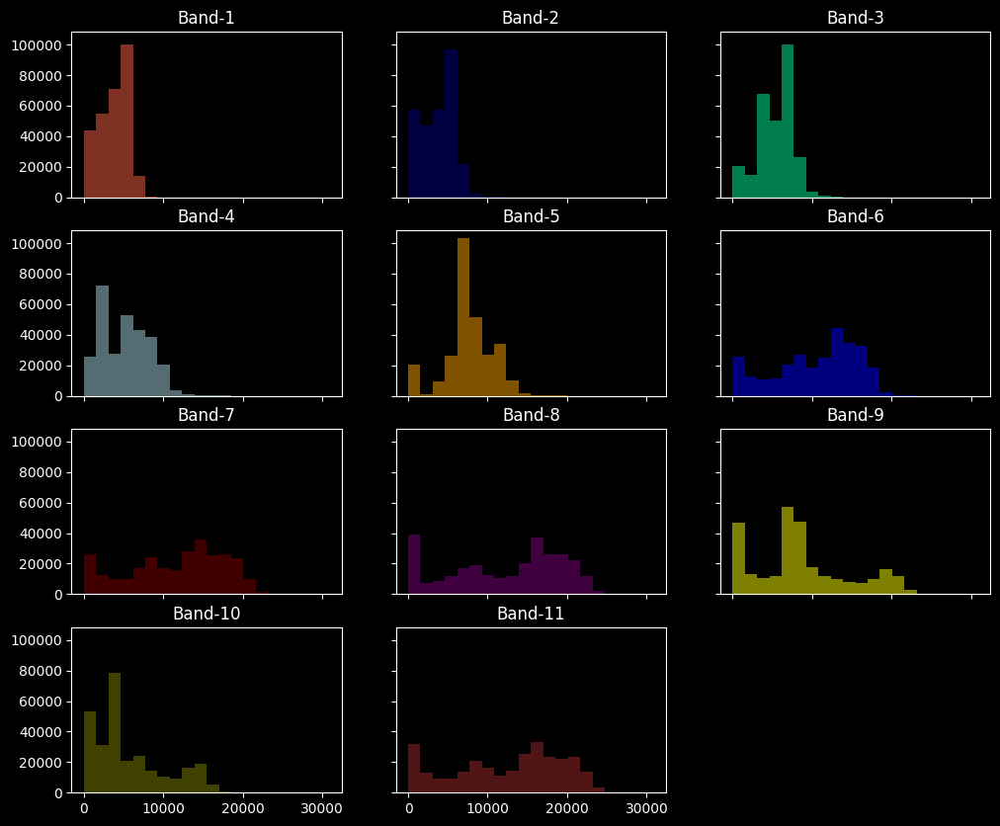

In [ ]:
colors = ['tomato', 'navy', 'MediumSpringGreen', 'lightblue', 'orange', 'blue',
          'maroon', 'purple', 'yellow', 'olive', 'brown', 'cyan']

ep.hist(arr_st,
        colors = colors,
        title=[f'Band-{i}' for i in range(1, 12)],
        cols=3,
        alpha=0.5,
        figsize = (12, 10)
        )

plt.show()

### **3.3.3) RGB Composite Image of all bands**

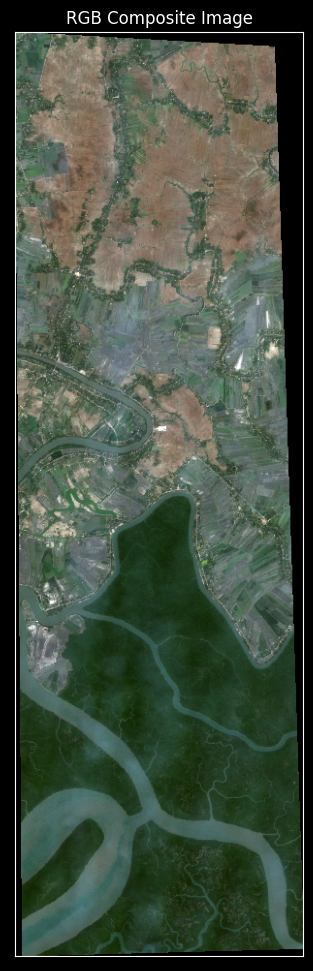

In [ ]:
ep.plot_rgb(
    arr_st,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 12),
    title="RGB Composite Image",
)

### **3.3.4) Visualization of the ground truth**

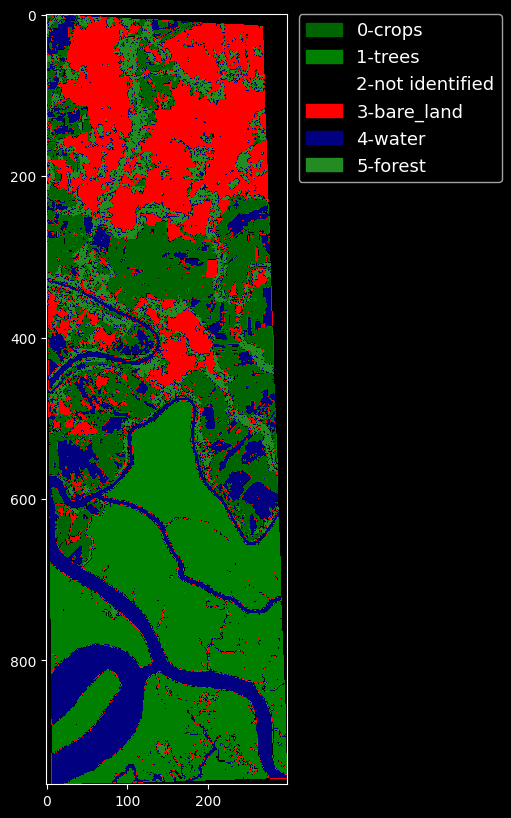

In [ ]:
cat_names = ["0-crops", "1-trees", "2-not identified", "3-bare_land", "4-water", "5-forest"]
f, ax = plt.subplots()
im_ax = ax.imshow(y_data, cmap=ListedColormap(['darkgreen', 'green', 'black', 'red', 'navy', 'forestgreen']))
leg_neg = ep.draw_legend(im_ax = im_ax, titles = cat_names)
plt.show()

### **3.4) Preprocessing**
<p style='text-align: justify'>Standardization is one of the scaling techniques where the values are centered around the mean with a unit standard deviation. This means that the mean of the attribute becomes zero and the resultant distribution has a unit standard deviation. The scaled data is divided into train and test data in the ratio of 80:20. The below code is used to scale and split the data.</p>

In [10]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

x = np.moveaxis(arr_st, 0, -1)

X_data = x.reshape(-1, 11)
scaler = StandardScaler().fit(X_data)
X_scaled = scaler.transform(X_data)

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_data.ravel(),
                                                    test_size=0.20, stratify = y_data.ravel())
print(f"X_train Shape: {X_train.shape}\nX_test Shape: {X_test.shape}\ny_train Shape: {y_train.shape}\ny_test Shape:{y_test.shape}")

X_train Shape: (227433, 11)
X_test Shape: (56859, 11)
y_train Shape: (227433,)
y_test Shape:(56859,)


### **3.5.1) Gradient Boosting Classifier**
<p style='text-align:justify'> Gradient boosting is a technique attracting attention for its prediction speed and accuracy, especially with large and complex data. Gradient boosting is a type of supervised machine learning boosting. It relies on the intuition that the best possible next model, when combined with previous models, minimizes the overall prediction error. The key idea is to set the target outcomes for this next model to minimize the error.</p>

In [ ]:
from xgboost import XGBClassifier
import xgboost as xgb

xgb_model = XGBClassifier()
xgb_model.fit(X_train, y_train)

xgb_model_pred = xgb_model.predict(X_test)
Accuracy_before = accuracy_score(y_test, xgb_model_pred)*100

print(f"Accuracy before: {Accuracy_before}")
print(classification_report(y_test, xgb_model_pred))

Accuracy before: 98.80757663694402
              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10814
           1       1.00      1.00      1.00     15714
           2       1.00      1.00      1.00      4064
           3       0.99      0.99      0.99     11193
           4       0.99      0.99      0.99      9030
           5       0.96      0.96      0.96      6044

    accuracy                           0.99     56859
   macro avg       0.99      0.99      0.99     56859
weighted avg       0.99      0.99      0.99     56859



The (default) Extreme Gradient Boosting Classifier algorithm has shown 98.65% accuracy on the test data.

### **3.5.2) Hyper parametrs tunning**

In [ ]:
# Look at parameters used by our current xgb
print('Parameters currently in use:\n')
pprint(xgb_model.get_params())
print(xgb_model.classes_)

Parameters currently in use:

{'base_score': 0.5,
 'booster': 'gbtree',
 'colsample_bylevel': 1,
 'colsample_bynode': 1,
 'colsample_bytree': 1,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_delta_step': 0,
 'max_depth': 3,
 'min_child_weight': 1,
 'missing': None,
 'n_estimators': 100,
 'n_jobs': 1,
 'nthread': None,
 'objective': 'multi:softprob',
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'scale_pos_weight': 1,
 'seed': None,
 'silent': None,
 'subsample': 1,
 'verbosity': 1}
[0 1 2 3 4 5]


### **3.5.2) Grid search**

In [ ]:
from xgboost import cv

# use a full grid over all parameters
xgb_train = xgb.DMatrix(X_train, label=y_train)
DM_test =  xgb.DMatrix(data = X_test, label = y_test)

xgb_grid = {'n_estimators':[100, 150, 200, 250],'max_depth': [8, 10, 15, 20]}
xgb_grid_search = GridSearchCV(estimator = xgb_model, param_grid = xgb_grid, cv = 5, verbose = 1)
xgb_grid_search.fit(X_train, y_train)
xgb_grid_search.best_params_

### **3.5.2) Predict the labels of test data**

In [ ]:
xgb_best_model = xgb_grid_search.best_estimator_
xgb_best_model.fit(X_train, y_train)
xgb_best_model_pred = xgb_best_model.predict(X_test)

Accuracy_after=accuracy_score(y_test, xgb_best_model_pred)*100
print(f"Accuracy after: {Accuracy_after}")

print(classification_report(y_test, xgb_best_model_pred))

### **3.5.3) Using best model**

In [ ]:
from xgboost import XGBClassifier
import xgboost as xgb
xgb_best_model = XGBClassifier(n_estimators=200, max_depth=8)
xgb_best_model.fit(X_train, y_train)
xgb_best_model_pred = xgb_best_model.predict(X_test)

Accuracy_after=accuracy_score(y_test, xgb_best_model_pred)*100
print(f"Accuracy after: {Accuracy_after}")

print(classification_report(y_test, xgb_best_model_pred))

Accuracy after: 99.04324733111733
              precision    recall  f1-score   support

           0       0.98      0.98      0.98     10814
           1       1.00      1.00      1.00     15714
           2       1.00      1.00      1.00      4064
           3       1.00      0.99      1.00     11193
           4       0.99      0.99      0.99      9030
           5       0.97      0.97      0.97      6044

    accuracy                           0.99     56859
   macro avg       0.99      0.99      0.99     56859
weighted avg       0.99      0.99      0.99     56859



### **3.5.4) Save the model**

In [ ]:
import pickle
pickle.dump(xgb_best_model,open('/content/drive/MyDrive/Land_cover_clf/xgb_best_model.dat','wb'))

### **3.4) Testing with our satellite image**
**the test imges are captured from :**   
  **1 "BARAGE EL HANSALI (Oum ER-Rbia River)"**   
  **2 : The region of the city of Agadir**


### **3.4.1) Read the images**

In [32]:
# Data Directory
os.chdir('/content/drive/MyDrive/Land_cover_clf/test_sat_img_BARAGE_EL_HANSALI')

# Read bands
sentinel_bands = glob("*.jp2")
sentinel_bands.sort()

# Composite the bands
bands_arr = []
for i in sentinel_bands:
  with rio.open(i, 'r') as f:
    g=f.read(1)
    bands_arr.append(g)
    print(i,"has shape",g.shape)

T30STB_20220905T105619_B01_60m.jp2 has shape (1830, 1830)
T30STB_20220905T105619_B02_60m.jp2 has shape (1830, 1830)
T30STB_20220905T105619_B03_60m.jp2 has shape (1830, 1830)
T30STB_20220905T105619_B04_60m.jp2 has shape (1830, 1830)
T30STB_20220905T105619_B05_60m.jp2 has shape (1830, 1830)
T30STB_20220905T105619_B06_60m.jp2 has shape (1830, 1830)
T30STB_20220905T105619_B07_60m.jp2 has shape (1830, 1830)
T30STB_20220905T105619_B09_60m.jp2 has shape (1830, 1830)
T30STB_20220905T105619_B11_60m.jp2 has shape (1830, 1830)
T30STB_20220905T105619_B12_60m.jp2 has shape (1830, 1830)
T30STB_20220905T105619_B8A_60m.jp2 has shape (1830, 1830)


In [33]:
# Data Directory
os.chdir('/content/drive/MyDrive/Land_cover_clf/test_sat_img_AGADIR')

# Read bands
sentinel_bands = glob("*.jp2")
sentinel_bands.sort()

# Composite the bands
bands_arr2 = []
for i in sentinel_bands:
  with rio.open(i, 'r') as f:
    g=f.read(1)
    bands_arr2.append(g)
    print(i,"has shape",g.shape)

T29RMP_20221013T111011_B01_60m.jp2 has shape (1830, 1830)
T29RMP_20221013T111011_B02_60m.jp2 has shape (1830, 1830)
T29RMP_20221013T111011_B03_60m.jp2 has shape (1830, 1830)
T29RMP_20221013T111011_B04_60m.jp2 has shape (1830, 1830)
T29RMP_20221013T111011_B05_60m.jp2 has shape (1830, 1830)
T29RMP_20221013T111011_B06_60m.jp2 has shape (1830, 1830)
T29RMP_20221013T111011_B07_60m.jp2 has shape (1830, 1830)
T29RMP_20221013T111011_B09_60m.jp2 has shape (1830, 1830)
T29RMP_20221013T111011_B11_60m.jp2 has shape (1830, 1830)
T29RMP_20221013T111011_B12_60m.jp2 has shape (1830, 1830)
T29RMP_20221013T111011_B8A_60m.jp2 has shape (1830, 1830)


In [34]:
arr_st = np.stack(bands_arr)
arr_st.shape

(11, 1830, 1830)

In [35]:
arr_st2 = np.stack(bands_arr2)
arr_st2.shape

(11, 1830, 1830)

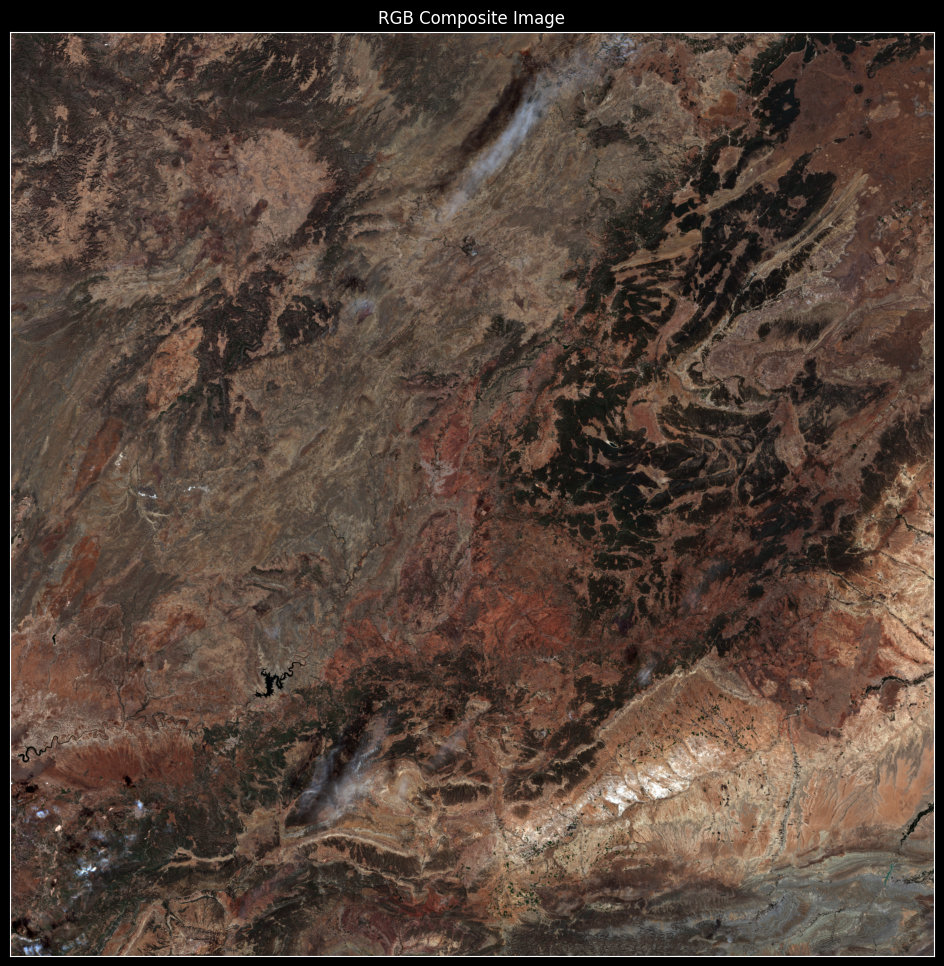

In [37]:
ep.plot_rgb(
    arr_st,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 12),
    title="RGB Composite Image",
)

plt.show()

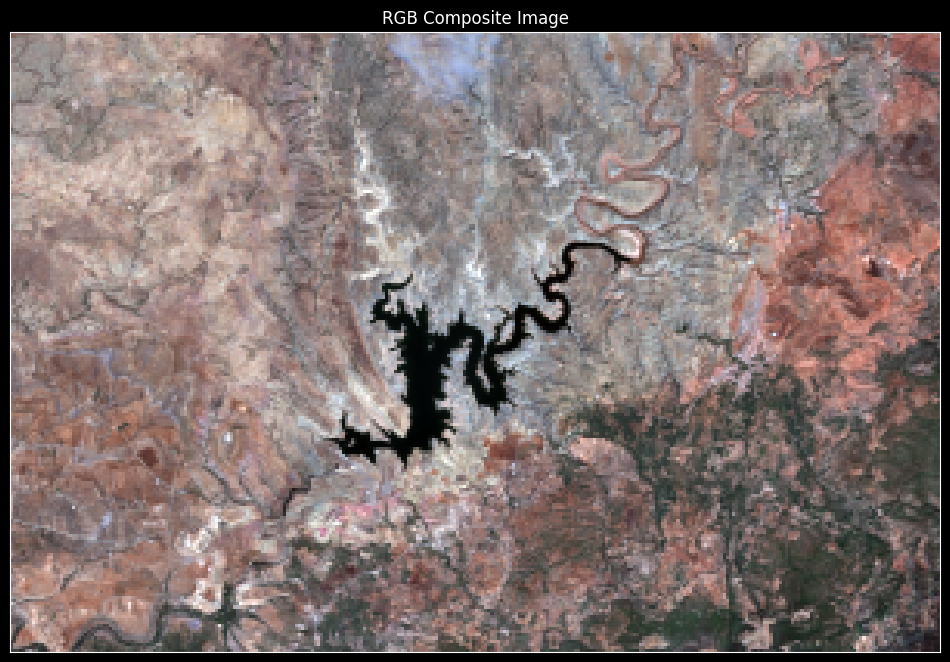

In [38]:
bands_arr = np.array(bands_arr)
bands_clip = []

for i in bands_arr:
  bands_clip.append(i[:][:,380:680])

bands_arr = np.array(bands_clip)
bands_arr = bands_arr[:][:,1180:1380]
bands_arr.shape
arr_st = np.stack(bands_arr)

ep.plot_rgb(
    arr_st,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 12),
    title="RGB Composite Image",
)

plt.show()

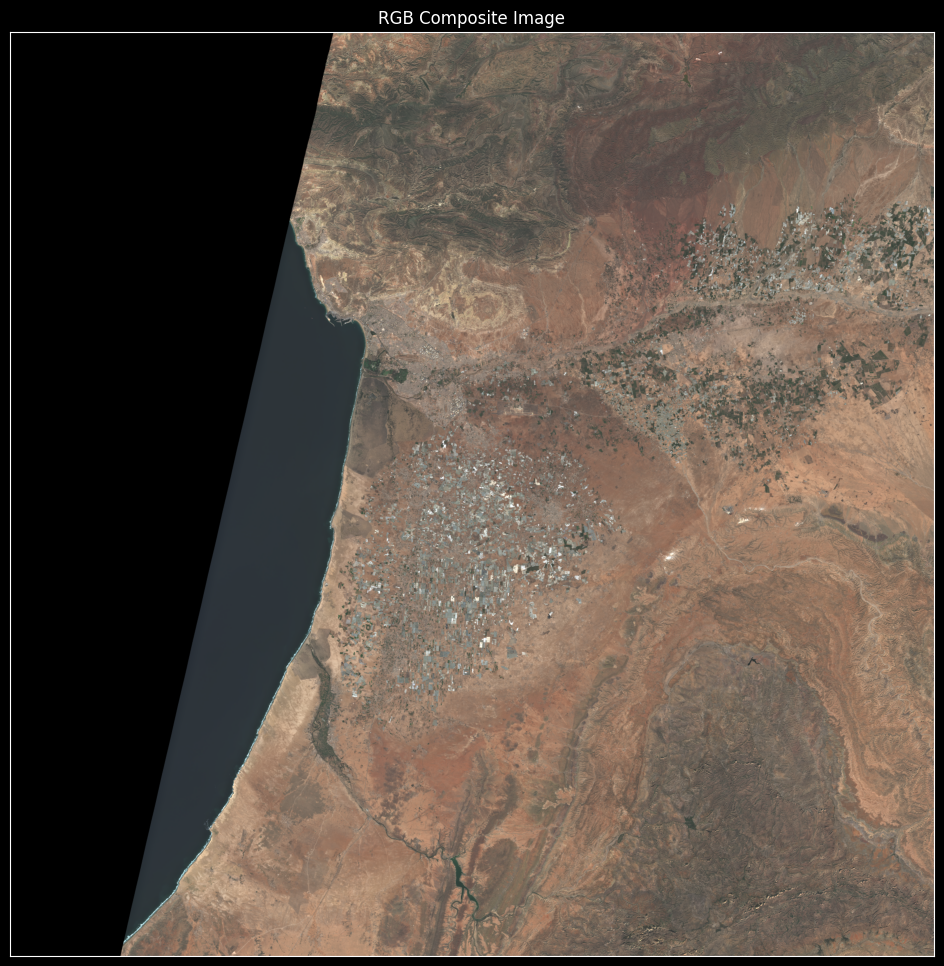

In [39]:
ep.plot_rgb(
    arr_st2,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 12),
    title="RGB Composite Image",
)

plt.show()

### **3.4.2) Preprocessing**

In [40]:
x = np.moveaxis(arr_st, 0, -1)

X_data2 = x.reshape(-1, 11)
scaler2 = StandardScaler().fit(X_data2)
test = scaler2.transform(X_data2)

test.shape

(60000, 11)

In [41]:
x = np.moveaxis(arr_st2, 0, -1)

X_data2 = x.reshape(-1, 11)
scaler2 = StandardScaler().fit(X_data2)
test2 = scaler2.transform(X_data2)

test2.shape

(3348900, 11)

In [42]:
np.array(bands_arr2).shape[2]**2

3348900

### **3.4.3) Prediction**

In [43]:
import pickle
xgb_best_model = pickle.load(open("/content/drive/MyDrive/Land_cover_clf/xgb_best_model.dat","rb"))
#xgb_best_model = pickle.load(open("/content/drive/MyDrive/Land_cover_clf/xgb_model_11.dat","rb"))
pred = xgb_best_model.predict(test)
pred2 = xgb_best_model.predict(test2)

In [44]:
pred.shape

(60000,)

In [45]:
pred2.shape

(3348900,)

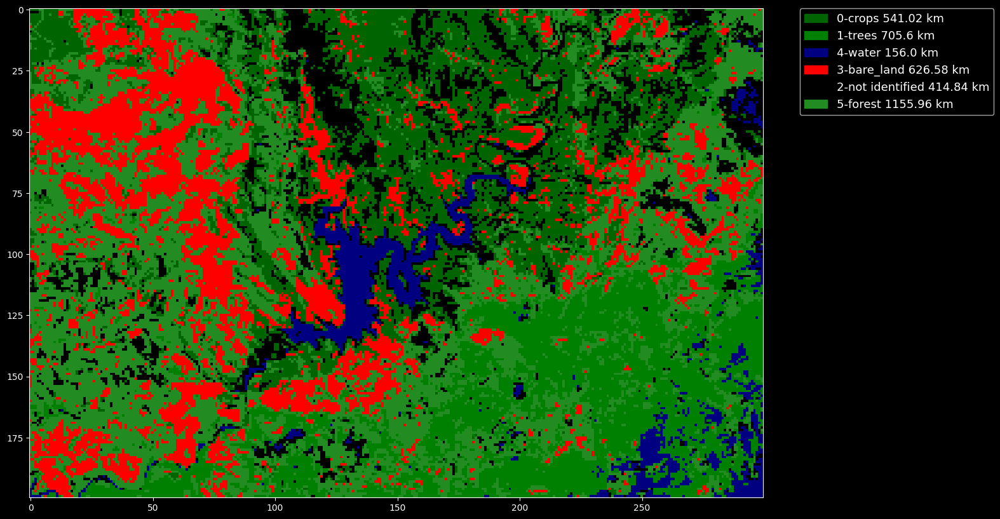

In [46]:
(unique, counts) = np.unique(pred, return_counts=True)
surface=(counts*60)/1000

cat_names = ["0-crops "+str(surface[1])+" km", "1-trees "+str(surface[0])+" km", "4-water "+str(surface[2])+" km", "3-bare_land "+str(surface[3])+" km", "2-not identified "+str(surface[4])+" km", "5-forest "+str(surface[5])+" km"]
f, ax = plt.subplots()
im_ax = ax.imshow(pred.reshape((bands_arr.shape[1], bands_arr.shape[2])), cmap=ListedColormap(['darkgreen', 'green', 'navy', 'red', 'black', 'forestgreen']))

leg_neg = ep.draw_legend(im_ax=im_ax, titles=cat_names)
plt.show()

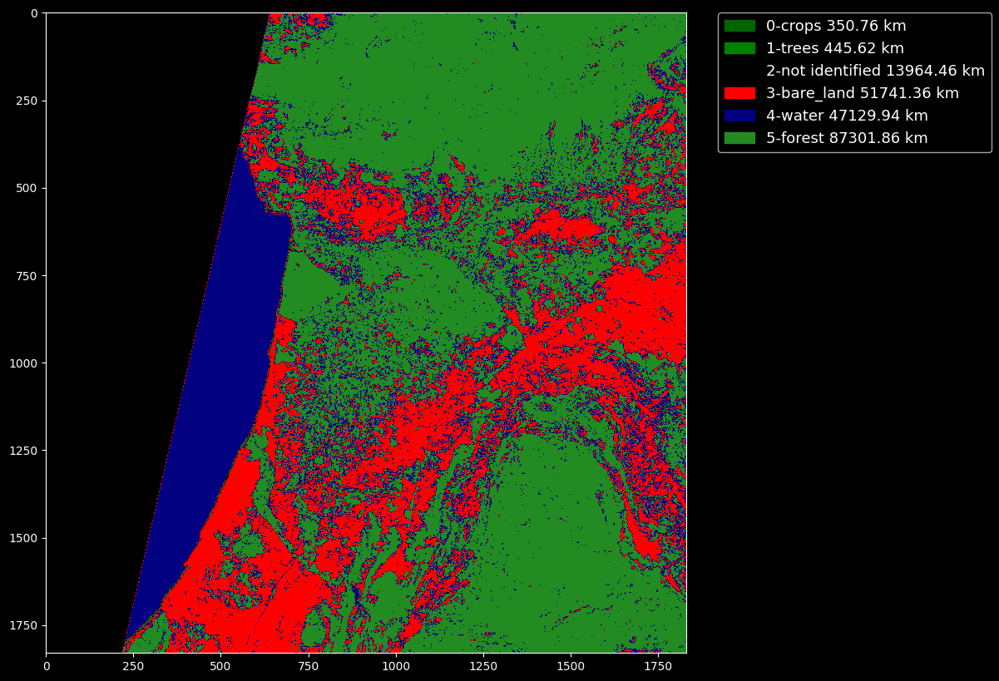

In [ ]:
# vrai vis
(unique, counts) = np.unique(pred2, return_counts=True)
surface=(counts*60)/1000

cat_names = ["0-crops "+str(surface[1])+" km", "1-trees "+str(surface[0])+" km", "2-not identified "+str(surface[4])+" km", "3-bare_land "+str(surface[3])+" km", "4-water "+str(surface[2])+" km", "5-forest "+str(surface[5])+" km"]
f, ax = plt.subplots()
im_ax = ax.imshow(pred2.reshape((np.array(bands_arr2).shape[1], np.array(bands_arr2).shape[2])), cmap=ListedColormap(['darkgreen', 'green', 'black', 'red', 'navy', 'forestgreen']))

leg_neg = ep.draw_legend(im_ax=im_ax, titles=cat_names)
plt.show()

### Conclusion

<p style='text-align:justify'>Due to the very limited timeframe, we selected a very small geographic area, whose geographic features were already identified by others so that it can be used as the ground truth. In the process of classification, we directly used the 12/11 spectral bands for identified features, where using appropriate remote sensing indices like NDVI or EVI is a much common practice. Opportunity is there to imply these indices through machine learning algorithms to classify land cover and land use change over a longer spatiotemporal scale. Furthermore, we could try ensemble methods of machine learning technique that combines several base models in order to produce one optimal predictive model, which is gaining popularity in recent years.


### <font color='blue'>Reference</font>

1. LaGro Jr JA. Land-use classification. In: Hillel D, editor., Elsevier Publication; 2005, p. 321–8. https://doi.org/doi.org/10.1016/B0-12-348530-4/00530-0.
2. Ozdogan M, Yang Y, Allez G, Cervantes C. Remote sensing of irrigated agriculture: Opportunities and challenges. Remote Sens 2010;2:2274–304. https://doi.org/10.3390/rs2092274.
3. Al-Doski J, Mansor SB, San HP, Khuzaimah Z. Improved Land Cover Mapping Using Landsat 8 Thermal Imagery. IOP Conf. Ser. Earth Environ. Sci., 2020, p. 540(1). https://doi.org/10.1088/1755-1315/540/1/012022.
4. Abdi AM. Land cover and land use classification performance of machine learning algorithms in a boreal landscape using Sentinel-2 data. GIScience Remote Sens 2020;57:1–20. https://doi.org/10.1080/15481603.2019.1650447.
5. Kakarla S. Sundarbans data, Satellite Imagery Analysis 2021. https://github.com/syamkakarla98/Satellite_Imagery_Analysis/tree/main/Data/sundarbans_data (accessed October 31, 2021).
6. Yuan F, Sawaya KE, Loeffelholz BC, Bauer ME. Land cover classification and change analysis of the Twin Cities (Minnesota) metropolitan area by multitemporal Landsat remote sensing. Remote Sens Environ 2005;98:317–28. https://doi.org/10.1016/j.rse.2005.08.006.

#### <font color='blue'>Data Source</font>
1. https://github.com/syamkakarla98/Satellite_Imagery_Analysis/tree/main/Data/sundarbans_data

<h1><b>II. Crops identification</b></h1>

#**1. Introduction**

### **1.1) Background**
 Precise crop type maps are crucial for monitoring cropping patterns, sustainable use of available natural resources and estimating harvests. Manual digitization and labeling—the usual method of creating crop type maps— is mostly time consuming, expensive and even prone to human errors. The Machine learning algorithms have been evolved as cost-effective alternatives for classifying crop varieties using satellite imageries in recent times. Coping with the recent advances, the machine learning algorithms will be deployed in this study to classify 6 crop types of north-western part (Godagari Upazila of Rajshahi district) in Bangladesh from Sentinel-2 imagery. Four machine learning algorithms (Random Forest, Artificial Neural Network, KNN and Support Vector Machine) will be investigated for mapping the crop types accurately.


### **1.2) Methodology**

### **1.2.1) Dataset**
In this study, Sentinel-2 satellite data has been used. 15 images were available from October 2020 to March 2021 with a cloud coverage of less than or equal to five percent covering the study area. The details of the available images are as follows: imegery dates for October (20201016, single image), November (20201105, 20201110, 20201115, 20201125, 20201130, 5 images), December (20201230, single image), January (20210109, single image), February (20210203, 20210208, 20210218, 20210223, 20210228, 5 images), March (20210305, 20210315, 2 images). We also have 577 ground truth points (GTPs) which have been collected by field visits from 22 February to 9 March 2021 which have been used as well. These GTPs include samples for all 7 crop types (Rice-175, Wheat-45, Potato-44, Maize-86, Mustard-23, Lentil-46, and Others-158) which we wanted to classify in this project.

### **1.2.1) Method**
In this study, GEE has been used to complete the task along with python API. The median image has been calculated for the study period during Oct-Mar. Median band reflectivity and vegetation indices (NDVI & EVI) for the total composite has been assessed here as well.
Four experimental schemes:
1. VIS bands;
2. VIS bands + NIR;
3. VIS bands + VI Indices;
4. VIS bands + NIR + VI Indices
<br> have been tested using RF, ANN (MPL), SVM , XGBoosting and KNN machine learning algorithms. Finally, the model results have been evaluated using Accuracy Assessment and F-score indices. The best algorithm then has been used to classify final crop type map of the study area.

### **1.3) Sentinel-2 Data Preprocessing:**
All the available 15 Sentinel-2 images have been used to derive a single band Median image for the six months during the study period (Oct. 2020-Mar. 2021). Here Sentinel-2 images have been processed using Google Earth Engine API, ee and geemap libraries. Using the Study area shapefile the respective median image has been derived, used and analyzed for further processing.

#**2. Setting the Environment**
geemap is a Python package for interactive mapping with Google Earth Engine, ipyleaflet, and ipywidgets, which is a cloud computing platform with a multi-petabyte catalog of satellite imagery and geospatial datasets. geemap is intended for students and researchers, who would like to utilize the Python ecosystem of diverse libraries and tools to explore Google Earth Engine. It is also designed for existing GEE users who would like to transition from the GEE JavaScript API to Python API. The automated JavaScript-to-Python conversion module of the geemap package can greatly reduce the time needed to convert existing GEE JavaScripts to Python scripts and Jupyter notebooks.

For more details: https://geemap.org/

In [ ]:
# after runing this cell you must restart the run time
!pip install geemap
!pip install -U geemap
!pip install geopandas
!pip install rasterio
%pip install earthpy

  Created wheel for ee-extra: filename=ee_extra-0.0.14-py3-none-any.whl size=209114 sha256=d1ab5877f52c33a0d0ff5db422bb2a4c30b157d826fcc25d68ce61d92484cfb1
  Stored in directory: /root/.cache/pip/wheels/50/1f/56/c638a525bcb6972c82e422747430d756edea7d57b539229bb3
  Created wheel for sankee: filename=sankee-0.2.0-py3-none-any.whl size=28745 sha256=ff3ce1cf0969169cdbef44efe4cf44881ace7c86d02299bafdf8d04989f466e8
  Stored in directory: /root/.cache/pip/wheels/36/b4/ac/84c3f06e5c44d3fe5029713232438862881e6e1f26657d5fd8
  Created wheel for pycrs: filename=PyCRS-1.0.2-py3-none-any.whl size=32704 sha256=ffa0cf8af613cf9c3820e63f7017b0423bd169bf9ca7c2b21a2f480e55236f3c
  Stored in directory: /root/.cache/pip/wheels/3e/ce/32/1ec0aba6b9770681a423e82f0274c57d09ad2c20c2864901f9
Successfully built ee-extra sankee pycrs
  Attempting uninstall: traitlets
    Found existing installation: traitlets 5.1.1
    Uninstalling traitlets-5.1.1:
      Successfully uninstalled traitlets-5.1.1
  Attempting uninsta

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import geemap
geemap.update_package()

In [ ]:
import ee
import geopandas as gpd

#**3. Data access**

In [ ]:
ee.Authenticate()

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=08FcSRuT0tUHWSoLrbv7vwWsrEstOhho3HXPgElavhQ&tc=_n1JEaU0nj8XmUqJztd5ca0Hp9tNpNOndCtvxzBpJCY&cc=PrKSV9EIQ3NDLEEJOP5rn-NXn3GE9x14cwxVU-VP910

The authorization workflow will generate a code, which you should paste in the box below.
Enter verification code: 4/1ARtbsJrUP_yfEf7_FvJaTb-0sqDEwA5XEd0nrmkyt4gT_M-K-WY3fce6OHA

Successfully saved authorization token.


In [ ]:
# Initialize the Earth Engine library
try:
  ee.Initialize()
  print('Google Earth Engine has initialized successfully!')
except ee.EEException as e:
  print('Google Earth Engine has failed to initialize!')
except:
    print("Unexpected error:", sys.exc_info()[0])
    raise

Google Earth Engine has initialized successfully!


In [ ]:
# Creating an interactive map
# Set your study areacoordinates as center and change the zoom value for better visualization
Map = geemap.Map(center=(24.478, 88.43), zoom=11)
Map

Map(center=[24.478, 88.43], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(childr…

In [ ]:
# Add Study area shapefile from your directory
# Read your Study area shape here from uploaded GEE Asset
roi = ee.FeatureCollection("projects/hassanidmansour/assets/Godagari_Upazila")
# Convert Feature Collecion to Geometry as String
aoi = roi.geometry()

In [ ]:
# Add Earth Engine data and filter as per need
# Monthly dataset collection
dataset = ee.ImageCollection("COPERNICUS/S2_SR")\
            .filterDate('2020-10-01', '2021-03-31')\
            .filterBounds(roi)\
            .filter('CLOUDY_PIXEL_PERCENTAGE <= 5')

In [ ]:
# Check the Image List
listOfImages = dataset.aggregate_array('system:index').getInfo()
print('Number of images in the collection: ', len(listOfImages))

listOfImages

Number of images in the collection:  33


['20201016T043801_20201016T044709_T45RXH',
 '20201105T044001_20201105T044932_T45QXG',
 '20201105T044001_20201105T044932_T45RXH',
 '20201110T044019_20201110T044603_T45QXG',
 '20201110T044019_20201110T044603_T45RXH',
 '20201115T044051_20201115T044045_T45QXG',
 '20201115T044051_20201115T044045_T45RXH',
 '20201125T044121_20201125T044124_T45RXH',
 '20201130T044139_20201130T044138_T45QXG',
 '20201130T044139_20201130T044138_T45RXH',
 '20201215T044211_20201215T044207_T45QXG',
 '20201220T044209_20201220T044209_T45QXG',
 '20201230T044209_20201230T044924_T45QXG',
 '20201230T044209_20201230T044924_T45RXH',
 '20210109T044149_20210109T044908_T45QXG',
 '20210109T044149_20210109T044908_T45RXH',
 '20210203T044011_20210203T045035_T45QXG',
 '20210203T044011_20210203T045035_T45RXH',
 '20210208T043939_20210208T044440_T45QXG',
 '20210208T043939_20210208T044440_T45RXH',
 '20210218T043829_20210218T044429_T45QXG',
 '20210218T043829_20210218T044429_T45RXH',
 '20210223T043801_20210223T044723_T45QXG',
 '20210223T

In [ ]:
# Set visualization parameters
rgb_vis = {'min':0, 'max':3000, 'bands':['B4','B3','B2']}
ndvi_colorizedVis = {"min":0,"max":1,"palette":["FFFFFF","CE7E45","DF923D", \
                    "F1B555","FCD163","99B718","74A901","66A000","529400","3E8601",\
                    "207401","056201","004C00","023B01","012E01","011D01","011301"]}

In [ ]:
# Oct-Mar Median Image Calculation
oct_mar_med = dataset.median().select('B2','B3','B4','B8','B5','B6','B7','B8A','B11','B12').clip(roi)

In [ ]:
# Visualizing median image
Map.addLayer(aoi)
Map.centerObject(aoi, 11)
Map.addLayer(oct_mar_med, rgb_vis, 'oct_median')
# Map.addLayer(nov_median, rgb_vis, 'nov_median')
# Map.addLayer(dec_median, rgb_vis, 'dec_median')
# Map.addLayer(jan_median, rgb_vis, 'jan_median')
# Map.addLayer(feb_median, rgb_vis, 'feb_median')
# Map.addLayer(mar_median, rgb_vis, 'mar_median')
Map

Map(bottom=3625.0, center=[24.462029090186643, 88.38602104206245], controls=(WidgetControl(options=['position'…

#**4. Reflectance Band Calculation**

In [ ]:
# Convert band values to reflectance values
oct_mar_ref = oct_mar_med.divide(10000)

#**5. Indices Calculation**
### **5.1) NDVI Calculation**

In [ ]:
oct_mar_ndvi = oct_mar_med.normalizedDifference(['B8', 'B4']).rename('ndvi').toDouble()

### **5.2) EVI Calculation**

In [ ]:
oct_mar_evi = oct_mar_med.expression('2.5*((NIR-R)/(NIR+6*R+1-7.5*B))',{
                                        'NIR':oct_mar_med.select('B8'),
                                        'R':oct_mar_med.select('B4'),
                                        'B':oct_mar_med.select('B2')}) \
                                        .rename('evi')

### **5.3) Final Composite Layer Derivation**

In [ ]:
oct_mar_comp = oct_mar_ref.addBands(oct_mar_ndvi).addBands(oct_mar_evi)

### **5.4) Output Investigation**

In [ ]:
# Get information about the bands as a list.
bandNames = oct_mar_comp.bandNames()
# ee.List of band names
print('Band Names: ', bandNames.getInfo())

Band Names:  ['B2', 'B3', 'B4', 'B8', 'B5', 'B6', 'B7', 'B8A', 'B11', 'B12', 'ndvi', 'evi']


In [ ]:
# Get projection information from band 1.
b2proj = oct_mar_comp.select('B2').projection()
# ee.Projection object
print('Band 2 projection: ', b2proj.getInfo())

Band 2 projection:  {'type': 'Projection', 'crs': 'EPSG:4326', 'transform': [1, 0, 0, 0, 1, 0]}


#**6. Reference Data Processing and Analysis**
Reference data have been processed here in two different ways.
Firstly, we have prepared our data outside of this environment in ArcGIS so that reference dataset can be utilized in a better way. We have clipped the composite median image using sample polygons generated from point GPS values by manual digitization based on field experiences. The clipped pixels then converted again into sample points for 10 meter scale resolution. Now, the sample points cover 40784 pixels (Rice-10950, Wheat-786, Potato-5967, Maize-2806, Mustard-208, Lentil-482, and Others-19585). Finally the processed sample point shapefile has been exported into .csv file format and analyzed below:   

--------------------------------------------------------------------------------------------------------

In [ ]:
data = gpd.read_file("/content/drive/MyDrive/Land_cover_clf/Godagari_Upazila/RefData.shp")

In [ ]:
'''data["FID"]=data.index'''
data.drop(["geometry"],axis=1,inplace=True)
data

,pointid,grid_code,Type,Value,B2,B3,B4,B8,B5,B6,B7,B8A,B11,B12,NDVI,EVI
0,312,0.08075,Rice,1,0.0666,0.0850,0.0897,0.1554,0.1125,0.1356,0.1504,0.1682,0.1599,0.0896,0.268054,0.845778
1,313,0.08070,Rice,1,0.0660,0.0830,0.0915,0.1724,0.1120,0.1379,0.1514,0.1694,0.1616,0.0926,0.306556,0.892936
2,314,0.08075,Rice,1,0.0662,0.0852,0.0902,0.1665,0.1120,0.1379,0.1514,0.1694,0.1616,0.0926,0.297234,0.902745
3,315,0.08085,Rice,1,0.0672,0.0851,0.0910,0.1681,0.1125,0.1356,0.1504,0.1682,0.1599,0.0896,0.297569,0.916984
4,316,0.08145,Rice,1,0.0653,0.0865,0.0926,0.1654,0.1125,0.1356,0.1504,0.1682,0.1599,0.0896,0.282171,0.786687
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40779,1,0.08450,Others,7,0.0680,0.1009,0.1052,0.2412,0.1474,0.2281,0.2416,0.2637,0.2432,0.1845,0.392610,0.937931
40780,2,0.08470,Others,7,0.0691,0.0973,0.1028,0.2518,0.1424,0.2177,0.2327,0.2562,0.2372,0.1612,0.420192,1.062919
40781,3,0.08540,Others,7,0.0745,0.0984,0.1040,0.2404,0.1572,0.2124,0.2289,0.2480,0.2583,0.2017,0.396051,1.115290
40782,4,0.08735,Others,7,0.0708,0.1003,0.1058,0.2436,0.1426,0.2086,0.2310,0.2491,0.2522,0.1849,0.394390,0.991367


In [ ]:
#No. of observation by crop type (Class)
data['Type'].value_counts().sort_values()

Mustard      208
Lentil       482
Wheat        786
Maize       2806
Potato      5967
Rice       10950
Others     19585
Name: Type, dtype: int64

#**6. Crop specific spectral response**

In [ ]:
# Drop Value column
data1 = data.drop(['Value','NDVI','EVI','pointid', 'grid_code'], axis=1)
me_spec = data1.groupby(['Type']).mean()
me_spec_t = me_spec.transpose()
me_spec_t

Type,Lentil,Maize,Mustard,Others,Potato,Rice,Wheat
B2,0.083534,0.077572,0.079573,0.096671,0.078404,0.077699,0.066113
B3,0.111863,0.096939,0.108807,0.125035,0.107411,0.104933,0.088976
B4,0.124080,0.081127,0.107191,0.114570,0.096299,0.100092,0.079622
B8,0.262024,0.260879,0.271557,0.121021,0.312261,0.231420,0.267996
B5,0.165522,0.112621,0.160313,0.126355,0.153658,0.142223,0.123366
B6,0.226557,0.205998,0.231341,0.116221,0.259868,0.202418,0.217591
B7,0.249095,0.253787,0.259280,0.121744,0.300461,0.221817,0.255961
B8A,0.269411,0.266923,0.279192,0.118926,0.327353,0.238328,0.276281
B11,0.254620,0.170973,0.216983,0.125592,0.226354,0.179965,0.185085
B12,0.183351,0.096306,0.141231,0.112544,0.139435,0.103225,0.112439


<Figure size 1500x1000 with 0 Axes>

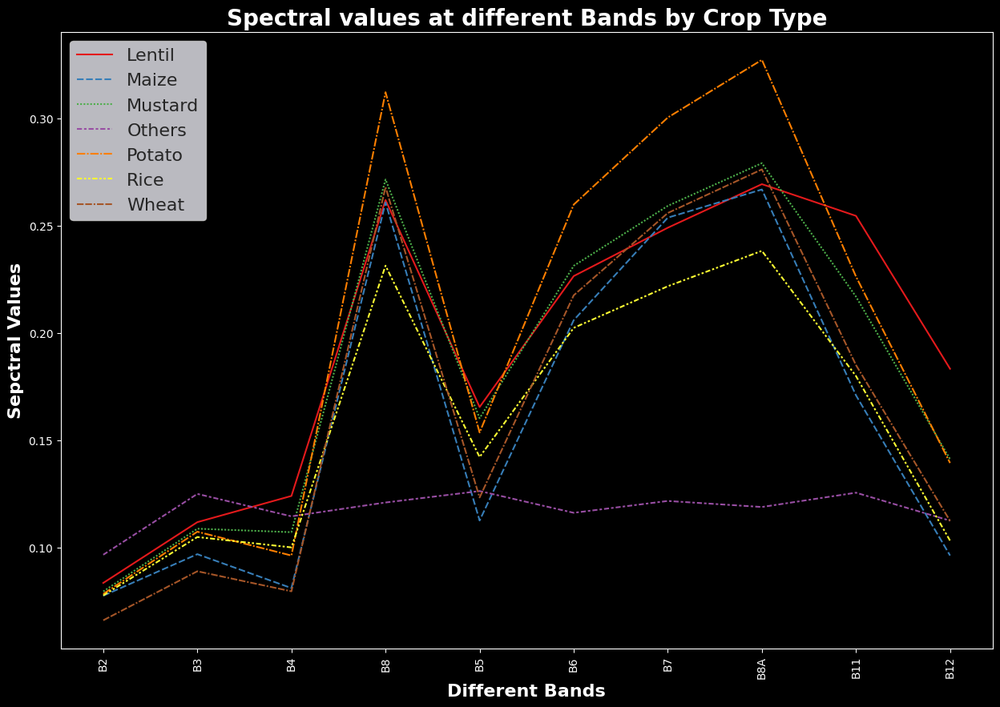

In [ ]:
plt.style.use('dark_background')
plt.figure(figsize=(15,10))
s = sns.lineplot(data=me_spec_t, alpha=1, palette = "Set1")
plt.title("Spectral values at different Bands by Crop Type", fontsize=20, fontweight="bold")
plt.xlabel("Different Bands", fontsize=16, fontweight="bold")
plt.ylabel("Sepctral Values", fontsize=16, fontweight="bold")
plt.xticks(rotation=90)
sns.set(style='dark')
s.legend(fontsize=16)
plt.show()

#**6. Response of different crop types**

In [ ]:
# Descriptive statistics of the spectral values and VIs
data2 = data.drop(['Value', 'B2', 'B3', 'B4', 'B8', 'B5', 'B6', 'B7', 'B8A', 'B11', 'B12',  'pointid', 'grid_code'], axis=1) # Drop Value column
me_spec = data2.groupby(['Type']).mean()
me_spec_t=me_spec
me_spec_t

,NDVI,EVI
Type,,
Lentil,0.357680,0.946214
Maize,0.525370,2.906864
Mustard,0.432894,1.350845
Others,-0.101686,0.820563
Potato,0.527948,1.908365
Rice,0.390974,1.400188
Wheat,0.540792,1.952659


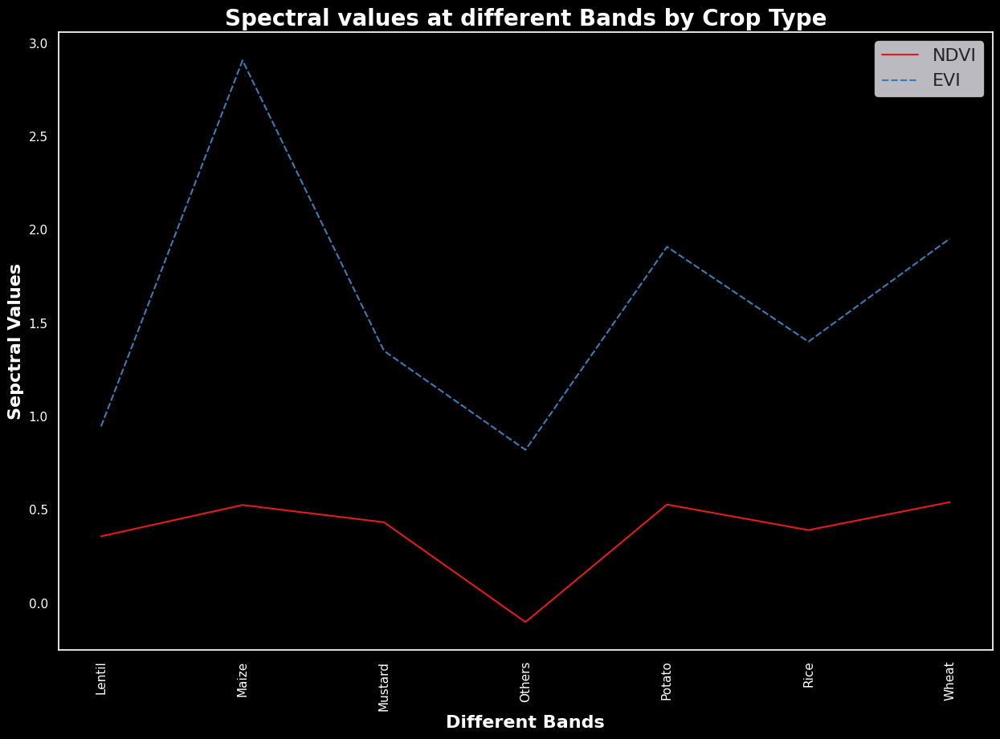

In [ ]:
plt.style.use('dark_background')
plt.figure(figsize=(15,10))
s = sns.lineplot(data=me_spec_t, alpha=1, palette = "Set1")
plt.title("Spectral values at different Bands by Crop Type", fontsize=20, fontweight="bold")
plt.xlabel("Different Bands", fontsize=16, fontweight="bold")
plt.ylabel("Sepctral Values", fontsize=16, fontweight="bold")
plt.xticks(rotation=90)
sns.set(style='dark')
s.legend(fontsize=16)
plt.show()

#**7. Model Development**

In [ ]:
data

,pointid,grid_code,Type,Value,B2,B3,B4,B8,B5,B6,B7,B8A,B11,B12,NDVI,EVI
0,312,0.08075,Rice,1,0.0666,0.0850,0.0897,0.1554,0.1125,0.1356,0.1504,0.1682,0.1599,0.0896,0.268054,0.845778
1,313,0.08070,Rice,1,0.0660,0.0830,0.0915,0.1724,0.1120,0.1379,0.1514,0.1694,0.1616,0.0926,0.306556,0.892936
2,314,0.08075,Rice,1,0.0662,0.0852,0.0902,0.1665,0.1120,0.1379,0.1514,0.1694,0.1616,0.0926,0.297234,0.902745
3,315,0.08085,Rice,1,0.0672,0.0851,0.0910,0.1681,0.1125,0.1356,0.1504,0.1682,0.1599,0.0896,0.297569,0.916984
4,316,0.08145,Rice,1,0.0653,0.0865,0.0926,0.1654,0.1125,0.1356,0.1504,0.1682,0.1599,0.0896,0.282171,0.786687
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40779,1,0.08450,Others,7,0.0680,0.1009,0.1052,0.2412,0.1474,0.2281,0.2416,0.2637,0.2432,0.1845,0.392610,0.937931
40780,2,0.08470,Others,7,0.0691,0.0973,0.1028,0.2518,0.1424,0.2177,0.2327,0.2562,0.2372,0.1612,0.420192,1.062919
40781,3,0.08540,Others,7,0.0745,0.0984,0.1040,0.2404,0.1572,0.2124,0.2289,0.2480,0.2583,0.2017,0.396051,1.115290
40782,4,0.08735,Others,7,0.0708,0.1003,0.1058,0.2436,0.1426,0.2086,0.2310,0.2491,0.2522,0.1849,0.394390,0.991367


In [ ]:
df_model = pd.get_dummies(data[['pointid', 'grid_code', 'Type', 'Value', 'B2', 'B3', 'B4', 'B8', 'B5', 'B6', 'B7', 'B8A', 'B11', 'B12', 'NDVI', 'EVI']])
# df_model.tail()
df_model.drop(columns=['pointid', 'grid_code'],inplace=True)
# df_model.tail()
y = df_model.pop('Value')

#Model_Scheme (RGB + NIR Bands + Indices)
df_model = df_model.loc[:, ['B2', 'B3', 'B4', 'B8','NDVI', 'EVI']]
X = df_model
X.columns

Index(['B2', 'B3', 'B4', 'B8', 'NDVI', 'EVI'], dtype='object')

### **7.1) Test-Train Splitting**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.30, random_state=42)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

scaler = StandardScaler() #scaler = MinMaxScaler(feature_range=(0, 1))
scaler.fit(X_train)

X_train = scaler.transform(X_train)
X_test= scaler.transform(X_test)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((28548, 6), (12236, 6), (28548,), (12236,))

### **7.2) Random Forest Classifier**

In [ ]:
param_grid = {
                 'n_estimators': [ 50,60,70],
                 'max_depth': [ 15,20]
             }

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix

rf = RandomForestClassifier(n_estimators=50)
rf = rf.fit(X_train, y_train.values.ravel())

# Prediction Using Random Forest Classifier
Y_pred_rf = rf.predict(X_test)

Class_Acc_RF4 = accuracy_score(y_test, Y_pred_rf)*100
print(Class_Acc_RF4)
# print("Classification accuracy of RF is", Class_Acc_RF)
print(classification_report(y_test, Y_pred_rf))

93.41288002615234
              precision    recall  f1-score   support

           1       0.89      0.93      0.91      3335
           2       0.75      0.66      0.70       210
           3       0.92      0.93      0.92      1748
           4       0.86      0.85      0.86       808
           5       0.82      0.15      0.25        62
           6       0.72      0.39      0.50       153
           7       0.99      0.98      0.98      5920

    accuracy                           0.93     12236
   macro avg       0.85      0.70      0.73     12236
weighted avg       0.93      0.93      0.93     12236



In [ ]:
from sklearn.model_selection import GridSearchCV
clf = RandomForestClassifier()
grid_clf = GridSearchCV(clf, param_grid, cv=5)
grid_clf.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [15, 20], 'n_estimators': [50, 60, 70]})

In [ ]:
grid_clf.best_params_

{'max_depth': 20, 'n_estimators': 50}

### **7.3) Save the module**

In [ ]:
best_estimator = grid_clf.best_estimator_
import pickle
pickle.dump(best_estimator, open("/content/drive/MyDrive/Land_cover_clf/best_estimatorCroptyp.dat", 'wb'))

#**8. Prediction**

### **8.1) Read and visualize the test data**

In [ ]:
import pickle
# import the module
best_estimator = pickle.load(open("/content/drive/MyDrive/Land_cover_clf/best_estimatorCroptyp.dat", 'rb'))

In [ ]:
# Data Directory
os.chdir('/content/drive/MyDrive/Land_cover_clf/Rajshahi')

# Read bands
sentinel_bands = glob("*.jp2")
sentinel_bands.sort()

# Composite the bands
bands_arr = []
for i in sentinel_bands:
  with rio.open(i, 'r') as f:
    g = f.read(1)
    bands_arr.append(g)
    print(i,"has shape",g.shape)
    # Data as array

T45RXH_20220424T043659_B02_60m.jp2 has shape (1830, 1830)
T45RXH_20220424T043659_B03_60m.jp2 has shape (1830, 1830)
T45RXH_20220424T043659_B04_60m.jp2 has shape (1830, 1830)
T45RXH_20220424T043659_B8A_60m.jp2 has shape (1830, 1830)


In [ ]:
arr_st = np.stack(bands_arr)
arr_st.shape

(4, 1830, 1830)

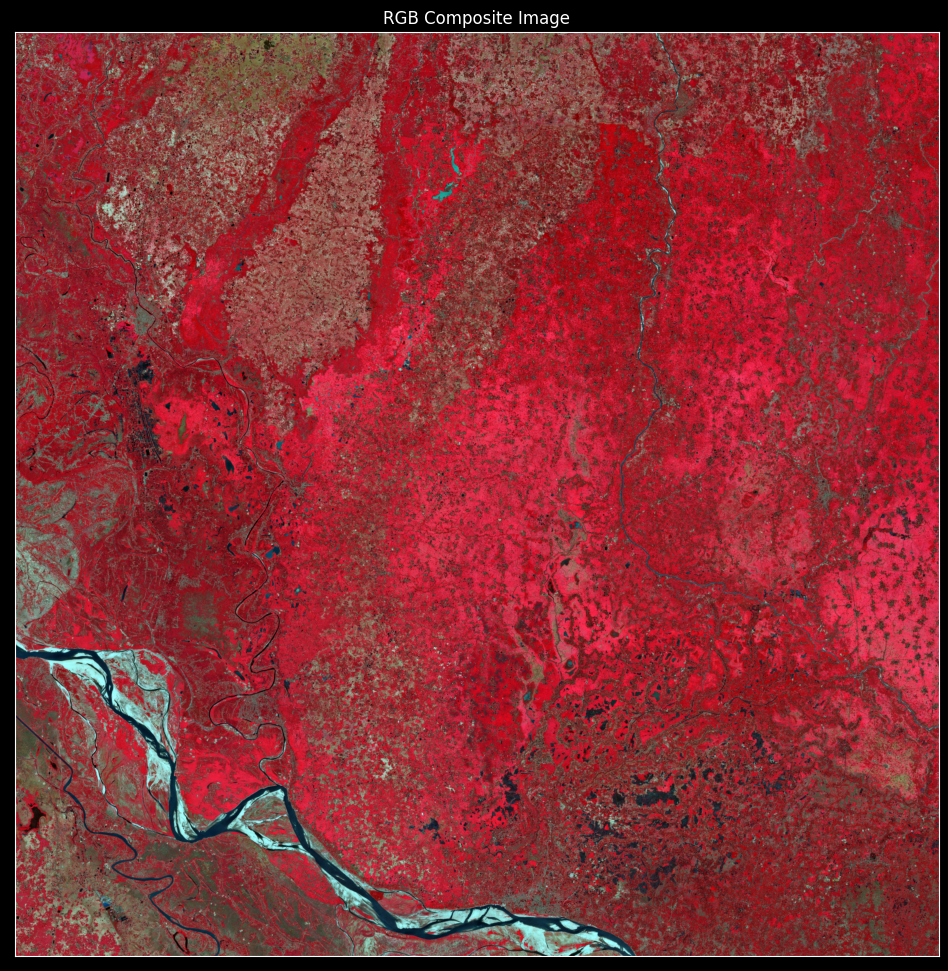

In [ ]:
plt.style.use('dark_background')
ep.plot_rgb(
    arr_st,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 12),
    title="RGB Composite Image",
)

plt.show()

In [ ]:
bands_arr = np.array(bands_arr)
bands_clip = []
print("bands_arr  ", bands_arr.shape)
for i in bands_arr:
  bands_clip.append(i[:][:, 200:1000])
print("bands_clip  ", len(bands_clip))

bands_arr = np.array(bands_clip)
print("bands_arr  ", bands_arr.shape)
bands_arr = bands_arr[:][:, 200:1000]
print("bands_arr  ", bands_arr.shape)
bands_arr.shape
arr_st = np.stack(bands_arr)
print("arr_st  ", arr_st.shape)

bands_arr   (4, 1830, 1830)
bands_clip   4
bands_arr   (4, 1830, 800)
bands_arr   (4, 800, 800)
arr_st   (4, 800, 800)


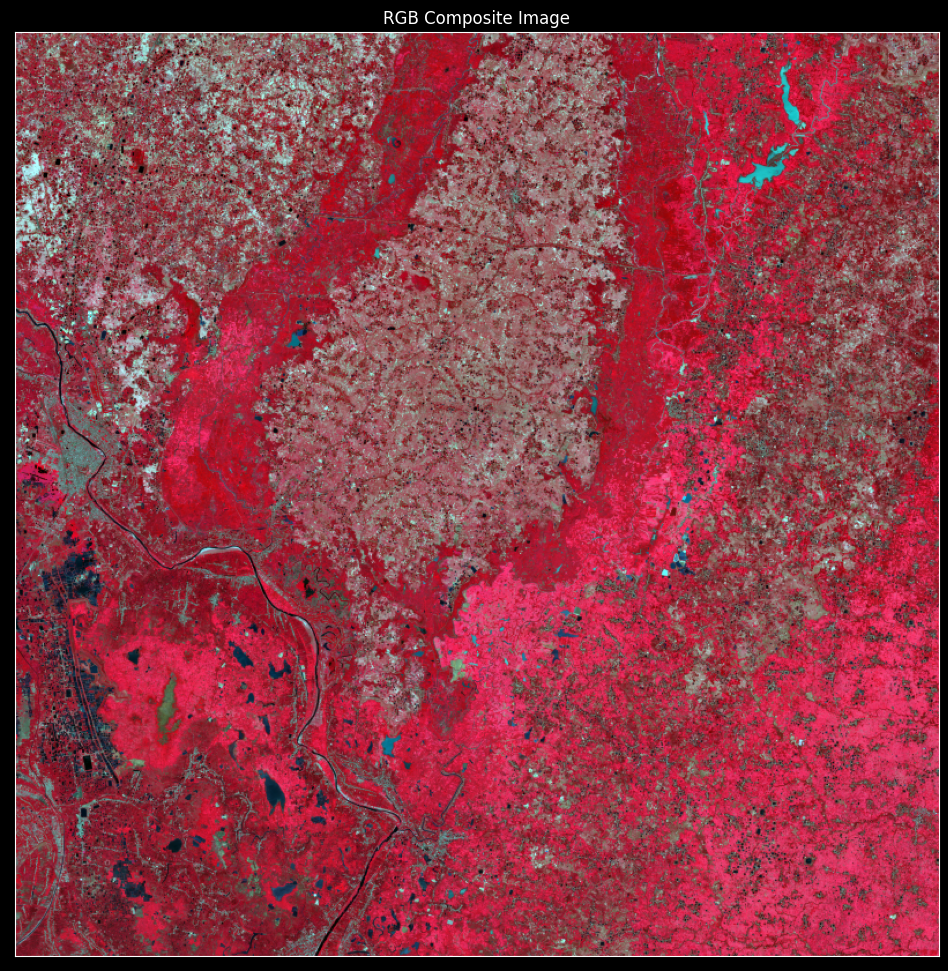

In [ ]:
ep.plot_rgb(
    arr_st,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.02,
    figsize=(12, 12),
    title="RGB Composite Image"
)

plt.show()

In [ ]:
x = np.moveaxis(arr_st, 0, -1)

X_data2 = x.reshape(-1, 4)
scaler2 = StandardScaler().fit(X_data2)
test = scaler2.transform(X_data2)

test.shape

(640000, 4)

### **8.2) Preprocessing**

In [ ]:
bands=['B2', 'B3', 'B4', 'B8']

In [ ]:
test=pd.DataFrame(test,columns=bands)
test

,B2,B3,B4,B8
0,0.015279,-0.340604,0.064170,-0.592822
1,-1.182370,-1.424059,-1.169292,-1.607087
2,-0.832720,-0.826770,-0.790494,-0.608766
3,0.883373,0.781049,0.864381,-0.744901
4,0.589990,0.499768,0.615795,-0.948489
...,...,...,...,...
639995,-0.728228,-0.496872,-0.944380,1.645427
639996,-0.145479,0.263630,-0.399858,1.604955
639997,-0.338389,0.194178,-0.470883,1.522783
639998,0.188094,1.062331,0.019188,2.061190


### **8.3) Indices Calculation**

##### NDVI Calculation

In [ ]:
test['ndvi']=(test['B8']-test['B4'])/test['B8']+test['B4']
test

,B2,B3,B4,B8,ndvi
0,0.015279,-0.340604,0.064170,-0.592822,1.172415
1,-1.182370,-1.424059,-1.169292,-1.607087,-0.896876
2,-0.832720,-0.826770,-0.790494,-0.608766,-1.089011
3,0.883373,0.781049,0.864381,-0.744901,3.024779
4,0.589990,0.499768,0.615795,-0.948489,2.265032
...,...,...,...,...,...
639995,-0.728228,-0.496872,-0.944380,1.645427,0.629562
639996,-0.145479,0.263630,-0.399858,1.604955,0.849282
639997,-0.338389,0.194178,-0.470883,1.522783,0.838342
639998,0.188094,1.062331,0.019188,2.061190,1.009879


##### EVI Calculation

In [ ]:
test['evi'] = 2.5*((test['B8']-test['B4'])/(test['B8']+6*test['B4']+1-7.5*test['B2']))
test

,B2,B3,B4,B8,ndvi,evi
0,0.015279,-0.340604,0.064170,-0.592822,1.172415,-2.423952
1,-1.182370,-1.424059,-1.169292,-1.607087,-0.896876,-0.879153
2,-0.832720,-0.826770,-0.790494,-0.608766,-1.089011,0.239914
3,0.883373,0.781049,0.864381,-0.744901,3.024779,3.398224
4,0.589990,0.499768,0.615795,-0.948489,2.265032,5.762548
...,...,...,...,...,...,...
639995,-0.728228,-0.496872,-0.944380,1.645427,0.629562,2.652564
639996,-0.145479,0.263630,-0.399858,1.604955,0.849282,3.864621
639997,-0.338389,0.194178,-0.470883,1.522783,0.838342,2.229647
639998,0.188094,1.062331,0.019188,2.061190,1.009879,2.891355


### **8.4) Prediction**

In [ ]:
pred = best_estimator.predict(test)

In [ ]:
pred.shape

(640000,)

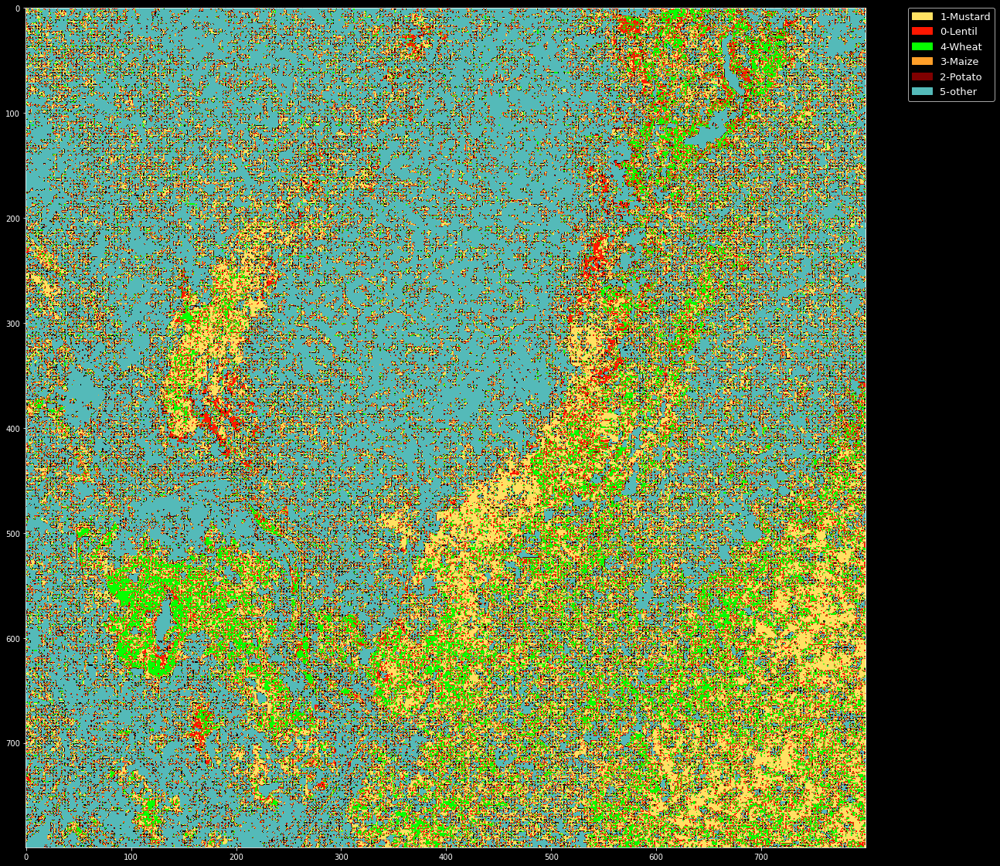

In [ ]:
cat_names = ["1-Mustard", "0-Lentil", "4-Wheat", "3-Maize", "2-Potato", "5-other"]

f, ax = plt.subplots(figsize=(20, 20))
im_ax = ax.imshow(pred.reshape((bands_arr.shape[1], bands_arr.shape[2])), cmap=ListedColormap(['#FFE162', '#FF1700', '#06FF00', '#FF9F29', 'black', 'maroon','#54BAB9']))
#CA6F1E
leg_neg = ep.draw_legend(im_ax = im_ax, titles = cat_names)
plt.show()

### <font color='blue'>Reference</font>

1. LaGro Jr JA. Land-use classification. In: Hillel D, editor., Elsevier Publication; 2005, p. 321–8. https://doi.org/doi.org/10.1016/B0-12-348530-4/00530-0.
2. Ozdogan M, Yang Y, Allez G, Cervantes C. Remote sensing of irrigated agriculture: Opportunities and challenges. Remote Sens 2010;2:2274–304. https://doi.org/10.3390/rs2092274.
3. Al-Doski J, Mansor SB, San HP, Khuzaimah Z. Improved Land Cover Mapping Using Landsat 8 Thermal Imagery. IOP Conf. Ser. Earth Environ. Sci., 2020, p. 540(1). https://doi.org/10.1088/1755-1315/540/1/012022.
4. Abdi AM. Land cover and land use classification performance of machine learning algorithms in a boreal landscape using Sentinel-2 data. GIScience Remote Sens 2020;57:1–20. https://doi.org/10.1080/15481603.2019.1650447.
5. Kakarla S. Sundarbans data, Satellite Imagery Analysis 2021. https://github.com/syamkakarla98/Satellite_Imagery_Analysis/tree/main/Data/sundarbans_data (accessed October 31, 2021).
6. Yuan F, Sawaya KE, Loeffelholz BC, Bauer ME. Land cover classification and change analysis of the Twin Cities (Minnesota) metropolitan area by multitemporal Landsat remote sensing. Remote Sens Environ 2005;98:317–28. https://doi.org/10.1016/j.rse.2005.08.006.

#### <font color='blue'>Data Source</font>
1. https://github.com/syamkakarla98/Satellite_Imagery_Analysis/tree/main/Data/sundarbans_data

The study area shapefile can be accesses on:
https://code.earthengine.google.com/?asset=users%2Fshohelovro%2FCropTypePaper%2FGodagari_Upazila&fbclid=IwAR0yP7K6kvB9vsP6GJ7E8SR3wyFAOA6_ab4frGGrHEGRAAu36D5kFt8qbxk

The composite image can be accessed on:
https://drive.google.com/file/d/1KywwGYj1oVxrzyKH6322IE7olfXImT4D/view?fbclid=IwAR3saSt8WEvGpck_4yk-84mv3dqz-L7XjYZ3n-iuYcvDm7oAQKzF4jokY6E

## END